# GC DATASET - REGRESSION MODELS

In [2]:
#This notebook use XGboost Version 1.5.0.
#!pip install --quiet statsmodels xgboost

In [3]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt

import xgboost as xgb
from scipy.optimize import nnls
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

plt.rcParams['figure.figsize'] = (6, 4)

In [4]:
# Parameters to control the notebook
start_year = 10
finish_year = 300

#Define the minimum loss and max_loss
min_loss = 0.0     # 1.50E+08
max_loss = 3.0E+10 # 4.00E+09

run_black_box_models = True

In [5]:
# Read the input files provided by the simulation model
event_loss = pd.read_csv("01_Event_Loss_Table/QuakeCube_Morocco_GCAT_ELT_120222.csv")
exposure = pd.read_csv("02_Exposure_by_Station/Exposure_by_Station_MAR_0.05dd_Buffer0_AllEXP_Region.csv")
IM = pd.read_csv("03_IM_by_Event_by_Station/E_S_IM_MAR_0.05dd_buffer0.csv")

# Read the input files provided by historical events
historical = pd.read_csv("04_ShakeMaps/Event_File_Historical.csv")
IM_test = pd.read_csv("04_ShakeMaps/Res_0.05dd/USGS_ShakeMap_Filtered_MAR_0.05dd_buffer0_F.csv")

# Rename the column PSA03 to IM
IM_test.rename(columns={'PSA03': 'IM'}, inplace=True)

In [6]:
# Filter Rows Based on Matching Event IDs

# Keep only the rows in event_loss that correspond to events for which there is information in the 'IM' DataFrame.
event_loss = event_loss.loc[event_loss['EventID'].isin(IM.Event_ID.unique())]
# Sort Rows by Event ID and Reset Index
event_loss = event_loss.sort_values(by='EventID').reset_index()
print(np.mean(event_loss['Loss']))
event_loss.shape

67054415.96174699


(24648, 8)

In [7]:
# Create Matrix

# Set 'Event_ID' as the index, 'Station_ID' as the columns, and 'IM' as the values.
Matrix = IM.pivot(index='Event_ID', columns='Station_ID', values='IM')

# Find the set of unique 'Station_ID' values in the exposure DataFrame that are not present in the IM DataFrame.
# It then sets the corresponding columns in the 'Matrix' DataFrame to 0
Matrix[list(set(exposure.Station_ID.unique()) - set(IM.Station_ID.unique()))] = 0

# Reindex the columns based on unique 'Station_ID' in the exposure DataFrame.
Matrix = Matrix.reindex(columns=exposure.Station_ID.unique())

# Rename the column
Matrix.columns = ['Station_ID_' + str(col) if col != 'Station_ID' else col for col in Matrix.columns]
Matrix.fillna(0, inplace=True)

# Sort the rows based on the 'Event_ID' index.
Matrix = Matrix.sort_index().reset_index()
Matrix.drop('Event_ID', axis=1, inplace=True)
Matrix

,Station_ID_1,Station_ID_2,Station_ID_3,Station_ID_4,Station_ID_5,Station_ID_6,Station_ID_7,Station_ID_8,Station_ID_9,Station_ID_10,...,Station_ID_22137,Station_ID_22138,Station_ID_22139,Station_ID_22140,Station_ID_22141,Station_ID_22142,Station_ID_22143,Station_ID_22144,Station_ID_22145,Station_ID_22146
0,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
1,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
2,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
3,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
4,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24643,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
24644,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
24645,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
24646,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000


In [8]:
# Create Matrix_test

# Set 'Event_ID' as the index, 'Station_ID' as the columns, and 'IM' as the values.
Matrix_test = IM_test.pivot(index='Event_ID', columns='Station_ID', values='IM')

# Find the set of unique 'Station_ID' values in the exposure DataFrame that are not present in the IM DataFrame.
# It then sets the corresponding columns in the 'Matrix' DataFrame to 0
Matrix_test[list(set(exposure.Station_ID.unique()) - set(IM_test.Station_ID.unique()))] = 0

# Reindex the columns based on unique 'Station_ID' in the exposure DataFrame.
Matrix_test = Matrix_test.reindex(columns=exposure.Station_ID.unique())

# Rename the column
Matrix_test.columns = ['Station_ID_' + str(col) if col != 'Station_ID' else col for col in Matrix_test.columns]
Matrix_test.fillna(0, inplace=True)

# Sort the rows based on the 'Event_ID' index.
Matrix_test = Matrix_test.sort_index().reset_index()
Matrix_test.drop('Event_ID', axis=1, inplace=True)
Matrix_test

,Station_ID_1,Station_ID_2,Station_ID_3,Station_ID_4,Station_ID_5,Station_ID_6,Station_ID_7,Station_ID_8,Station_ID_9,Station_ID_10,...,Station_ID_22137,Station_ID_22138,Station_ID_22139,Station_ID_22140,Station_ID_22141,Station_ID_22142,Station_ID_22143,Station_ID_22144,Station_ID_22145,Station_ID_22146
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [9]:
# Create Weighted IM parameter
# Weighted_IM (WIM) is the SUM{s in S}[alpha_s * IM_s]; M is earthquake magnitude, D is its deep
# WIM provides a weighted measure that reflects the overall impact of an earthquake on the entire region.

# Convert datasets to NumPy arrays
X = np.array(Matrix)
weights = np.array(exposure['Weight'])

# Define the function for the weighted sum as:
# Weighted_IM = w_1 * IM_1 + w_2 * IM_2 + ... + w_n * IM_n
def weighted_im(X):
    return np.abs(np.sum(weights * X))

def weighted_im_sq(X):
    return np.abs(np.sum(weights * (X ** 2)))

def weighted_im_cb(X):
    return np.abs(np.sum(weights * (X ** 3)))

# Create DataFrame with simulated event parameters
df = pd.DataFrame(event_loss[["Magnitude", "centroid_depth", "Loss"]])

# Apply the weighted sum function to each row of the IM columns
df['WIM'] = Matrix.apply(weighted_im, axis=1)
df['W*IM^2'] = Matrix.apply(weighted_im_sq, axis=1)
df['W*IM^3'] = Matrix.apply(weighted_im_cb, axis=1)

# Create the new variables WIM^2 and WIM^3
# df['WIM^2'] = df['WIM'] ** 2
# df['WIM^3'] = df['WIM'] ** 3

# Rename column names
df = df.rename(columns={'Magnitude': 'M', 'centroid_depth': 'D'})
df

,M,D,Loss,WIM,W*IM^2,W*IM^3
0,4.75,5.0,7.716915e+07,0.009435,0.001200,0.000342
1,4.75,35.0,1.728780e+07,0.002289,0.000197,0.000022
2,5.15,35.0,4.975969e+07,0.004367,0.000599,0.000123
3,4.75,5.0,1.522857e+06,0.000777,0.000060,0.000006
4,4.75,5.0,1.307489e+07,0.003270,0.000271,0.000027
...,...,...,...,...,...,...
24643,5.25,5.0,1.112707e+04,0.001972,0.000129,0.000009
24644,4.55,25.0,1.786958e+01,0.000710,0.000039,0.000002
24645,5.25,15.0,2.373668e+05,0.014855,0.000877,0.000052
24646,5.85,25.0,1.053835e+06,0.023957,0.001537,0.000101


In [10]:
# Create a DataFrame with historical data parameters
df_test = pd.DataFrame(historical[["M", "Depth", "Year"]])

# Apply the weighted sum function to each row of the IM columns
df_test['WIM'] = Matrix_test.apply(weighted_im, axis=1)
df_test['W*IM^2'] = Matrix_test.apply(weighted_im_sq, axis=1)
df_test['W*IM^3'] = Matrix_test.apply(weighted_im_cb, axis=1)

# Create the new variables WIM^2 and WIM^3
# df_test['WIM^2'] = df_test['WIM'] ** 2
# df_test['WIM^3'] = df_test['WIM'] ** 3

# Rename column names
df_test = df_test.rename(columns={'Depth': 'D'})
df_test

,M,D,Year,WIM,W*IM^2,W*IM^3
0,5.9,10.0,1960,0.030378,0.014681,9.838912e-03
1,5.2,15.0,1970,0.002140,0.000038,9.475134e-07
2,5.6,28.6,1992,0.001060,0.000188,4.630908e-05
3,5.6,25.6,1992,0.001063,0.000217,6.147365e-05
4,6.0,9.7,1994,0.008249,0.000721,1.529868e-04
5,6.4,0.0,2004,0.023416,0.008623,9.197763e-03
6,5.3,10.1,2004,0.001646,0.000109,1.274137e-05
7,5.1,0.0,2004,0.001632,0.000119,1.904022e-05
8,5.0,10.8,2004,0.000943,0.000034,2.232465e-06
9,6.3,12.0,2016,0.008927,0.000403,2.952483e-05


               M         D      Loss       WIM    W*IM^2    W*IM^3
M       1.000000 -0.055389  0.288859  0.536504  0.353060  0.173838
D      -0.055389  1.000000 -0.050247 -0.001902 -0.043354 -0.046417
Loss    0.288859 -0.050247  1.000000  0.589538  0.948009  0.843915
WIM     0.536504 -0.001902  0.589538  1.000000  0.716875  0.398501
W*IM^2  0.353060 -0.043354  0.948009  0.716875  1.000000  0.890788
W*IM^3  0.173838 -0.046417  0.843915  0.398501  0.890788  1.000000


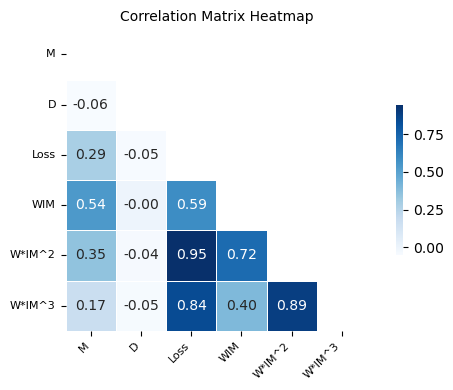

In [11]:
# Compute the correlation matrix
corr_matrix = df.corr()
print(corr_matrix)


# the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# heatmap
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='Blues', cbar_kws={'shrink': .5}, square=True, linewidths=.5, cbar=True)


plt.title("Correlation Matrix Heatmap", fontsize=10)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

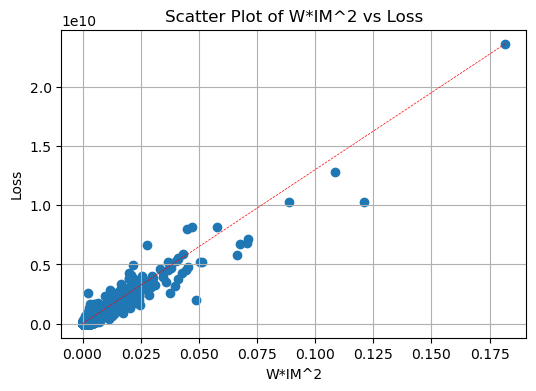

In [12]:
# Show a scatterplot of 'W*IM^2' vs. 'Loss'
plt.scatter(df['W*IM^2'], df['Loss'])

# Determine the maximum values for x and y axes
x_max = df['W*IM^2'].max()
y_max = df['Loss'].max()

# Plot a line from (0,0) to (x_max, y_max)
plt.plot([0, x_max], [0, y_max], color='red', linestyle='--', linewidth=0.5)

# Add labels and title
plt.xlabel('W*IM^2')
plt.ylabel('Loss')
plt.title('Scatter Plot of W*IM^2 vs Loss')

# Add grid
plt.grid(True)

# Display the plot
plt.show()

## Fit Quadratic Regression Model

In [13]:
# Fit a quadratic model on WIM and WIM^2 (complete dataset)
X = df[['WIM', 'W*IM^2']]
y = df['Loss']

quadratic_model = sm.OLS(y, X).fit()
print(quadratic_model.summary())

                                 OLS Regression Results                                
Dep. Variable:                   Loss   R-squared (uncentered):                   0.918
Model:                            OLS   Adj. R-squared (uncentered):              0.918
Method:                 Least Squares   F-statistic:                          1.388e+05
Date:                Mon, 20 Nov 2023   Prob (F-statistic):                        0.00
Time:                        10:02:49   Log-Likelihood:                     -4.8912e+05
No. Observations:               24648   AIC:                                  9.782e+05
Df Residuals:                   24646   BIC:                                  9.783e+05
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

# Interactable Figure for ('WIM','W*IM^2' )

In [14]:
import plotly.graph_objects as go

# Find the maximum range for both X1 and X2
max_value = max(df['WIM'].max(), df['W*IM^2'].max())

# Use the maximum range value to create a uniform grid for X1 and X2
uniform_range = np.linspace(0, max_value, 100)
X1_grid, X2_grid = np.meshgrid(uniform_range, uniform_range)

# Predicting values using the quadratic model
predict_input = np.column_stack((X1_grid.ravel(), X2_grid.ravel()))
y_pred = quadratic_model.predict(predict_input)
y_pred = y_pred.reshape(X1_grid.shape)

# Create the plot using plotly
fig = go.Figure()

# Add the scatter plot for actual data points
fig.add_trace(go.Scatter3d(x=df['WIM'], y=df['W*IM^2'], z=df['Loss'],
                           mode='markers',
                           marker=dict(size=4, color='blue'),  # Use a distinct color for the data points
                           name='Data Points'))

# Add the surface plot for the predicted values
fig.add_trace(go.Surface(x=X1_grid, y=X2_grid, z=y_pred, colorscale='Viridis', name='Regression Surface'))

# layout 
fig.update_layout(title='3D Scatter Plot with Regression Surface',
                  scene=dict(
                      xaxis=dict(title='X1 (WIM)', range=[0, max_value]),
                      yaxis=dict(title='X2 (W*IM^2)', range=[0, max_value]),
                      zaxis=dict(title='Loss'),
                      aspectmode='cube'  # This ensures a cube-like aspect ratio
                  ),
                  margin=dict(l=0, r=0, b=0, t=0))

# Show the plot
#fig.write_image("Interactable_Figure.png")
fig.write_html("Interactable_Figure.html")
fig.show()


In [15]:
# Split the complete dataset into training and test sets
X = df[['WIM', 'W*IM^2']]
y = df['Loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#quadratic_model = sm.OLS(y_train, X_train).fit()
# Quadratic Regression (train and test sets)
quadratic_model = LinearRegression()
quadratic_model.fit(X_train, y_train)
y_pred_quadratic_test = quadratic_model.predict(X_test)
y_pred_quadratic_train = quadratic_model.predict(X_train)

# Calculate MSE and R-squared on the test dataset
mse_quadratic_test = mean_squared_error(y_test, y_pred_quadratic_test)
mse_quadratic_train = mean_squared_error(y_train, y_pred_quadratic_train)

r2_quadratic_test = r2_score(y_test, y_pred_quadratic_test)
r2_quadratic_train = r2_score(y_train, y_pred_quadratic_train)

print("MSE (Train Dataset):", mse_quadratic_train)
print("MSE (Test Dataset):", mse_quadratic_test)
print("\nR-squared (Train Dataset):", r2_quadratic_train)
print("R-squared (Test Dataset):", r2_quadratic_test)

#with more predictores we can run this part for adjust_r2
#print("*"*40)
# Number of observations (n) and number of predictors (p)
#n_train = X_train.shape[0]  # Number of observations in the training set
#n_test = X_test.shape[0]    # Number of observations in the test set
#p = X_train.shape[1]        # Number of predictors

# Function to calculate adjusted R-squared
#def adjusted_r2(r_squared, n, p):
#    return 1 - (1 - r_squared) * (n - 1) / (n - p - 1)

# Calculate adjusted R-squared for both train and test sets
#adjusted_r2_train = adjusted_r2(r2_quadratic_train, n_train, p)
#adjusted_r2_test = adjusted_r2(r2_quadratic_test, n_test, p)

# Print MSE and R-squared for train and test sets
#print("MSE (Train Dataset):", mse_quadratic_train)
#print("MSE (Test Dataset):", mse_quadratic_test)
#print("\nR-squared (Train Dataset):", r2_quadratic_train)
#print("R-squared (Test Dataset):", r2_quadratic_test)
#print("\nAdjusted R-squared (Train Dataset):", adjusted_r2_train)
#print("Adjusted R-squared (Test Dataset):", adjusted_r2_test)

MSE (Train Dataset): 1.0427463929343414e+16
MSE (Test Dataset): 8768043648772253.0

R-squared (Train Dataset): 0.9174528329871872
R-squared (Test Dataset): 0.9038423606248918


In [16]:
# Quadratic Regression (train = entire dataset)
quadratic_model.fit(X, y)
y_pred_quadratic = quadratic_model.predict(X)

# Get the model coefficients
a, b = quadratic_model.coef_
print(f'Model coefficients:')
print(f'a: {a}')
print(f'b: {b}')

# Calculate MSE and R-squared on the entire dataset
mse_quadratic = mean_squared_error(y, y_pred_quadratic)
r2_quadratic = r2_score(y, y_pred_quadratic)

print("\nMSE (Entire Dataset):", mse_quadratic)
print("R-squared (Entire Dataset):", r2_quadratic)

# Create a DataFrama for Gap
gap_quadratic = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_quadratic)])

# Predict the Losses using the trained model
df_quadratic = pd.DataFrame({'Lp_quadratic': y_pred_quadratic,
                            'Gap quadratic': gap_quadratic})
print(df_quadratic)
print(f'\nModel description:')
print("Mean:", df_quadratic['Lp_quadratic'].mean())
print("Standard deviation:", df_quadratic['Lp_quadratic'].std())
print("AvgGap(L_Q):", np.mean(gap_quadratic))

Model coefficients:
a: -4915371827.929331
b: 128614781495.42549

MSE (Entire Dataset): 1.0091524038993198e+16
R-squared (Entire Dataset): 0.915409063949752
       Lp_quadratic  Gap quadratic
0      1.062961e+08   3.774428e+01
1      1.234083e+07  -2.861538e+01
2      5.384473e+07   8.209553e+00
3      2.241040e+06   4.716024e+01
4      1.709659e+07   3.075893e+01
...             ...            ...
24643  5.154416e+06   4.622322e+04
24644 -2.477308e+05  -1.386427e+06
24645  3.809938e+07   1.595084e+04
24646  7.816679e+07   7.317366e+03
24647  5.078944e+08  -6.765533e+00

[24648 rows x 2 columns]

Model description:
Mean: 67054415.961747006
Standard deviation: 330470637.6575245
AvgGap(L_Q): 628537629.1430234


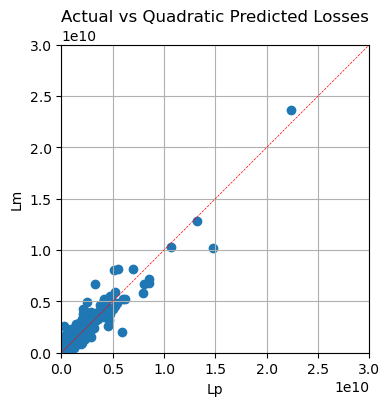

In [17]:
# Set aspect ratio
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')

# Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
plt.scatter(df_quadratic['Lp_quadratic'], df['Loss'])

# Add a diagonal line
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

# Set the y-axis limits
plt.xlim(0, max_loss)
plt.ylim(0, max_loss)

# Add labels and title
plt.xlabel('Lp')
plt.ylabel('Lm')
plt.title('Actual vs Quadratic Predicted Losses')

# Add grid
plt.grid(True)

# Display the plot
plt.savefig("Actual vs Quadratic Predicted Losses_Figure.png")
plt.show()

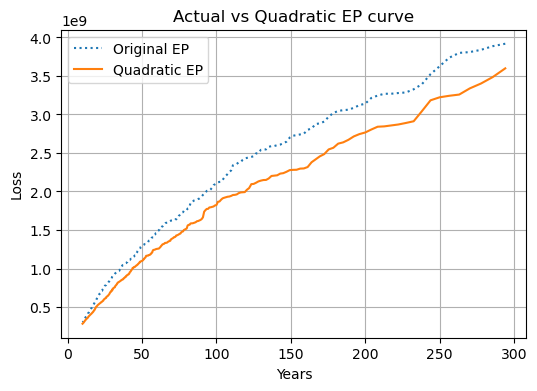

In [18]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
quadratic_ep = pd.DataFrame()
quadratic_ep['rp'] = rank
quadratic_ep['Loss'] = df_quadratic["Lp_quadratic"]
quadratic_ep['Loss'] = quadratic_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
quadratic_ep_filter = quadratic_ep.loc[quadratic_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(quadratic_ep_filter['rp'], quadratic_ep_filter['Loss'], label='Quadratic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Quadratic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Actual vs Quadratic EP curve.png")
plt.show()

## Fit Cubic Regression Model

In [19]:
# Fit a cubic model on WIM, WIM^2 and WIM^3 (complete dataset)
X = df[['WIM', 'W*IM^2', 'W*IM^3']]
y = df['Loss']

cubic_model = sm.OLS(y, X).fit()
print(cubic_model.summary())

                                 OLS Regression Results                                
Dep. Variable:                   Loss   R-squared (uncentered):                   0.941
Model:                            OLS   Adj. R-squared (uncentered):              0.941
Method:                 Least Squares   F-statistic:                          1.304e+05
Date:                Mon, 20 Nov 2023   Prob (F-statistic):                        0.00
Time:                        10:02:56   Log-Likelihood:                     -4.8519e+05
No. Observations:               24648   AIC:                                  9.704e+05
Df Residuals:                   24645   BIC:                                  9.704e+05
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

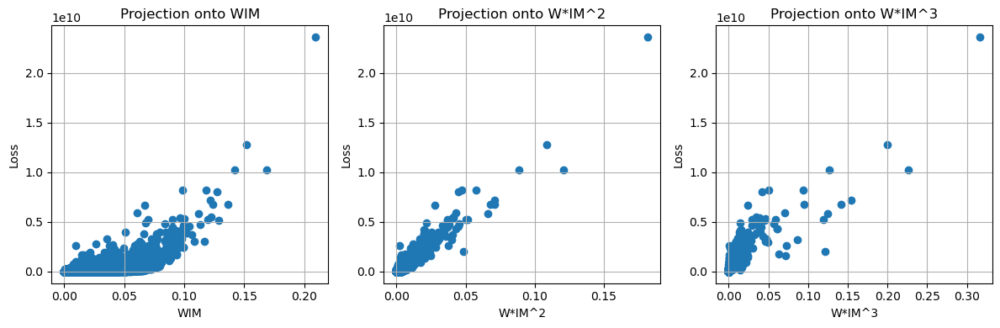

In [20]:
# Create a new figure for the projections
fig_projections = plt.figure(figsize=(12, 4))

# Create subplots for the WIM, W*IM^2 and W*IM^3 projections
ax_x1 = fig_projections.add_subplot(131)
ax_x2 = fig_projections.add_subplot(132)
ax_x3 = fig_projections.add_subplot(133)

# Plot the projections onto WIM, W*IM^3 and W*IM^2
ax_x1.scatter(df['WIM'], df['Loss'])
ax_x1.set_xlabel('WIM')
ax_x1.set_ylabel('Loss')
ax_x1.set_title('Projection onto WIM')

ax_x2.scatter(df['W*IM^2'], df['Loss'])
ax_x2.set_xlabel('W*IM^2')
ax_x2.set_ylabel('Loss')
ax_x2.set_title('Projection onto W*IM^2')

ax_x3.scatter(df['W*IM^3'], df['Loss'])
ax_x3.set_xlabel('W*IM^3')
ax_x3.set_ylabel('Loss')
ax_x3.set_title('Projection onto W*IM^3')

# Fit a linear regression line to the data
#fit_x1 = np.polyfit(df['WIM'], df['Loss'], 1)
#fit_x2 = np.polyfit(df['W*IM^2'], df['Loss'], 1)
#fit_x3 = np.polyfit(df['W*IM^3'], df['Loss'], 1)

# Add trendlines to the plots
#ax_x1.plot(df['WIM'], fit_x1[0] * df['WIM'] + fit_x1[1], color='red', linestyle='--', linewidth=0.5)
#ax_x2.plot(df['W*IM^2'], fit_x2[0] * df['W*IM^2'] + fit_x2[1], color='red', linestyle='--', linewidth=0.5)
#ax_x3.plot(df['W*IM^3'], fit_x2[0] * df['W*IM^3'] + fit_x2[1], color='red', linestyle='--', linewidth=0.5)

# Add grid
ax_x1.grid(True)
ax_x2.grid(True)
ax_x3.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [21]:
# Split the complete dataset into training and test sets
X = df[['WIM', 'W*IM^2', 'W*IM^3']]
y = df['Loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Cubic Regression (train set and test sets)
cubic_model = LinearRegression()
cubic_model.fit(X_train, y_train)
y_pred_cubic_test = cubic_model.predict(X_test)
y_pred_cubic_train = cubic_model.predict(X_train)

mse_cubic_test = mean_squared_error(y_test, y_pred_cubic_test)
mse_cubic_train = mean_squared_error(y_train, y_pred_cubic_train)
r2_cubic_test = r2_score(y_test, y_pred_cubic_test)
r2_cubic_train = r2_score(y_train, y_pred_cubic_train)

print("MSE (Train Dataset):", mse_cubic_train)
print("MSE (Test Dataset):", mse_cubic_test)
print("\nR-squared (Train Dataset):", r2_cubic_train)
print("R-squared (Test Dataset):", r2_cubic_test)

MSE (Train Dataset): 7400687631551775.0
MSE (Test Dataset): 7102876902768092.0

R-squared (Train Dataset): 0.9414137702061723
R-squared (Test Dataset): 0.9221039603472097


In [22]:
# Cubic Regression (train = entire dataset)
cubic_model.fit(X, y)
y_pred_cubic = cubic_model.predict(X)

# Get the model coefficients
a, b, c = cubic_model.coef_
print(f'Model coefficients:')
print(f'a: {a}')
print(f'b: {b}')
print(f'c: {c}')

# Calculate MSE and R-squared on the entire dataset
mse_cubic = mean_squared_error(y, y_pred_cubic)
r2_cubic = r2_score(y, y_pred_cubic)

print("\nMSE (Entire Dataset):", mse_cubic)
print("R-squared (Entire Dataset):", r2_cubic)

# Create a DataFrama for Gap
gap_cubic = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_cubic)])

# Predict the Losses using the trained model
df_cubic = pd.DataFrame({'Lp_cubic': y_pred_cubic,
                        'Gap cubic': gap_cubic})
print(df_cubic)
print(f'\nModel description:')
print("Mean:", df_cubic['Lp_cubic'].mean())
print("Standard deviation:", df_cubic['Lp_cubic'].std())
print("Avg_Gap(L_C):", np.mean(gap_cubic))

Model coefficients:
a: -11628459971.697073
b: 204510337933.63696
c: -42909452852.491844

MSE (Entire Dataset): 7338299461928872.0
R-squared (Entire Dataset): 0.938487624059257
           Lp_cubic     Gap cubic
0      1.219863e+08  5.807657e+01
1      1.353600e+07 -2.170200e+01
2      6.728210e+07  3.521407e+01
3      3.951743e+06  1.594953e+02
4      1.713466e+07  3.105016e+01
...             ...           ...
24643  3.900356e+06  3.495287e+04
24644  4.009876e+05  2.243867e+06
24645  5.297259e+06  2.131676e+03
24646  3.223271e+07  2.958611e+03
24647  5.063401e+08 -7.050858e+00

[24648 rows x 2 columns]

Model description:
Mean: 67054415.96174698
Standard deviation: 334610487.93651253
Avg_Gap(L_C): 8310071617.237634


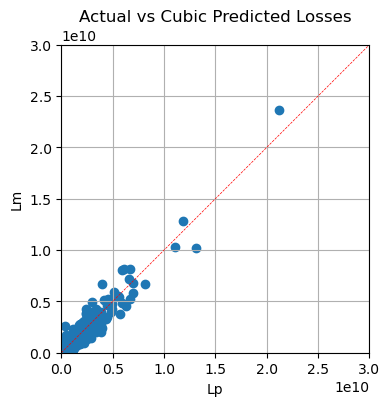

In [23]:
# Set aspect ratio
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')

# Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
plt.scatter(df_cubic['Lp_cubic'], df['Loss'])

# Add a diagonal line
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

# Set the y-axis limits
plt.xlim(0, max_loss)
plt.ylim(0, max_loss)

# Add labels and title
plt.xlabel('Lp')
plt.ylabel('Lm')
plt.title('Actual vs Cubic Predicted Losses')

# Add grid
plt.grid(True)

# Display the plot

plt.savefig("Actual vs Cubic Predicted Losses.png")
plt.show()

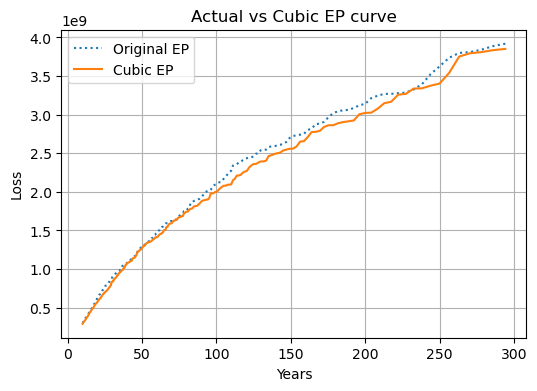

In [24]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
cubic_ep = pd.DataFrame()
cubic_ep['rp'] = rank
cubic_ep['Loss'] = df_cubic["Lp_cubic"]
cubic_ep['Loss'] = cubic_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
cubic_ep_filter = cubic_ep.loc[cubic_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(cubic_ep_filter['rp'], cubic_ep_filter['Loss'], label='Cubic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Cubic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Actual vs Cubic EP curve.png")
plt.show()

## Create NNLS model for Quadratic Regression

In [25]:
#nnls model for the entire dataset
X = df[['WIM', 'W*IM^2']].values
y = df['Loss'].values

# Apply non-negative least squares optimization
nnls_coeffs_quadratic, rnorm = nnls(X, y)

# Predict using the non-negative coefficients ( X * nnls_coeffs)
y_pred_nnls = np.matmul(X, nnls_coeffs_quadratic)

# Calculate MSE and R-squared on the entire dataset using non-negative predictions
mse_nnls = mean_squared_error(y, y_pred_nnls)
r2_nnls = r2_score(y, y_pred_nnls)

# Print the results
print("\nNNLS Regression:")
print("MSE (Entire Dataset):", mse_nnls)
print("R-squared (Entire Dataset):", r2_nnls)


# Get the model coefficients
a, b = nnls_coeffs_quadratic
print(f'Model coefficients:')
print(f'a: {a}')
print(f'b: {b}')

# Create a DataFrama for Gap
gap_nnls_quadratic = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_nnls)])


# Predict the Losses using the trained model and create a DataFrame
df_nnls_quadratic = pd.DataFrame({
    'Actual Loss': y,
    'Lp_nnls_quadratic': y_pred_nnls,
    'Gap nnls quadratic': gap_nnls_quadratic
})

# Model description: Show a statistical summary of the model predictions
print("\nModel Description:")
print(df_nnls_quadratic.describe())

print("Mean:", df_nnls_quadratic['Lp_nnls_quadratic'].mean())
print("Standard deviation:", df_nnls_quadratic['Lp_nnls_quadratic'].std())
print("Avg_Gap(L_NQ):", np.mean(gap_nnls_quadratic))


NNLS Regression:
MSE (Entire Dataset): 1.2703997918861138e+16
R-squared (Entire Dataset): 0.8935103289270784
Model coefficients:
a: 0.0
b: 110462702913.17267

Model Description:
        Actual Loss  Lp_nnls_quadratic  Gap nnls quadratic
count  2.464800e+04       2.464800e+04        2.464800e+04
mean   6.705442e+07       9.103875e+07        1.127695e+10
std    3.454023e+08       3.206343e+08        1.173703e+12
min    0.000000e+00       0.000000e+00       -1.000000e+02
25%    1.981873e+05       6.821757e+06        3.462489e+01
50%    4.938818e+06       2.422080e+07        2.710421e+02
75%    3.202478e+07       7.348920e+07        5.202835e+03
max    2.362179e+10       2.007564e+10        1.745045e+14
Mean: 91038751.28977309
Standard deviation: 320634291.8329541
Avg_Gap(L_NQ): 11276945752.163595


In [26]:
# Split the complete dataset into training and test sets
X = df[['WIM', 'W*IM^2']]
y = df['Loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



nnls_coeffs_quadratic, rnorm = nnls(X_train, y_train)

y_pred_nnls_test = np.matmul(X_test, nnls_coeffs_quadratic)
y_pred_nnls_train = np.matmul(X_train, nnls_coeffs_quadratic)


# Calculate MSE and R-squared on the test dataset
mse_nnls_quadratic_test = mean_squared_error(y_test, y_pred_nnls_test)
mse_nnls_quadratic_train = mean_squared_error(y_train, y_pred_nnls_train)

r2_nnls_quadratic_test = r2_score(y_test, y_pred_nnls_test)
r2_nnls_quadratic_train = r2_score(y_train, y_pred_nnls_train)

print("MSE (Train Dataset):", mse_nnls_quadratic_train)
print("MSE (Test Dataset):", mse_nnls_quadratic_test)
print("\nR-squared (Train Dataset):", r2_nnls_quadratic_train)
print("R-squared (Test Dataset):", r2_nnls_quadratic_test)

MSE (Train Dataset): 1.3106593765692054e+16
MSE (Test Dataset): 1.1095195026094914e+16

R-squared (Train Dataset): 0.8962439772626672
R-squared (Test Dataset): 0.8783208883471832


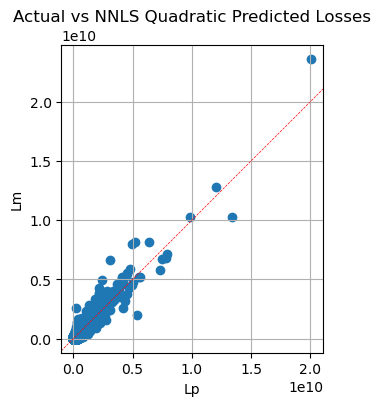

In [27]:
# Set aspect ratio
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')

# Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
plt.scatter(df_nnls_quadratic['Lp_nnls_quadratic'], df['Loss'])

# Add a diagonal line
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

# Add labels and title
plt.xlabel('Lp')
plt.ylabel('Lm')
plt.title('Actual vs NNLS Quadratic Predicted Losses')

# Add grid
plt.grid(True)

# Display the plot
plt.savefig("Actual vs NNLS Quadratic Predicted Losses.png")
plt.show()

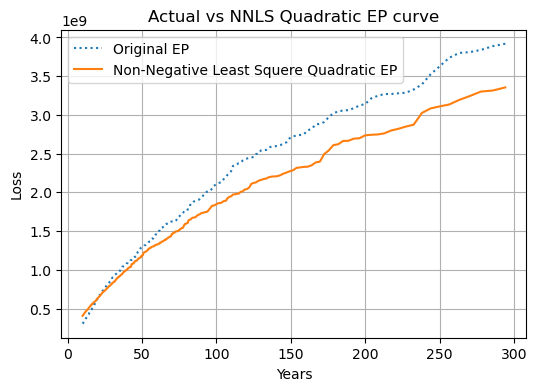

In [28]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
nnls_quadratic_ep = pd.DataFrame()
nnls_quadratic_ep['rp'] = rank
nnls_quadratic_ep['Loss'] = df_nnls_quadratic["Lp_nnls_quadratic"]
nnls_quadratic_ep['Loss'] = nnls_quadratic_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
nnls_quadratic_ep_filter = nnls_quadratic_ep.loc[nnls_quadratic_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(nnls_quadratic_ep_filter['rp'], nnls_quadratic_ep_filter['Loss'], label='Non-Negative Least Squere Quadratic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs NNLS Quadratic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Actual vs NNLS Quadratic EP curve.png")
plt.show()

## Create NNLS model for Cubic Regression

In [29]:
#nnls model for the entire dataset

X = df[['WIM', 'W*IM^2', 'W*IM^3']].values
y = df['Loss'].values

# Apply non-negative least squares optimization
nnls_coeffs_cubic, rnorm = nnls(X, y)

# Predict using the non-negative coefficients ( X * nnls_coeffs)
y_pred_nnls = np.matmul(X, nnls_coeffs_cubic)

# Calculate MSE and R-squared on the entire dataset using non-negative predictions
mse_nnls = mean_squared_error(y, y_pred_nnls)
r2_nnls = r2_score(y, y_pred_nnls)

# Print the results
print("\nNNLS Regression:")
print("MSE (Entire Dataset):", mse_nnls)
print("R-squared (Entire Dataset):", r2_nnls)


# Get the model coefficients
a, b, c = nnls_coeffs_cubic
print(f'Model coefficients:')
print(f'a: {a}')
print(f'b: {b}')
print(f'c: {c}')

# Create a DataFrama for Gap
gap_nnls_cubic = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_nnls)])


# Predict the Losses using the trained model and create a DataFrame
df_nnls_cubic = pd.DataFrame({
    'Actual Loss': y,
    'Lp_nnls_cubic': y_pred_nnls,
    'Gap nnls cubic': gap_nnls_cubic
})

# Model description: Show a statistical summary of the model predictions
print("\nModel Description:")
print(df_nnls_cubic.describe())

print("Mean:", df_nnls_cubic['Lp_nnls_cubic'].mean())
print("Standard deviation:", df_nnls_cubic['Lp_nnls_cubic'].std())
print("Avg_Gap(L_NC):", np.mean(gap_nnls_cubic))


NNLS Regression:
MSE (Entire Dataset): 1.2637757922753182e+16
R-squared (Entire Dataset): 0.8940655773962973
Model coefficients:
a: 0.0
b: 105560838697.54524
c: 4080205272.531267

Model Description:
        Actual Loss  Lp_nnls_cubic  Gap nnls cubic
count  2.464800e+04   2.464800e+04    2.464800e+04
mean   6.705442e+07   8.835732e+07    1.081170e+10
std    3.454023e+08   3.214866e+08    1.125777e+12
min    0.000000e+00   0.000000e+00   -1.000000e+02
25%    1.981873e+05   6.542037e+06    2.954108e+01
50%    4.938818e+06   2.324013e+07    2.562817e+02
75%    3.202478e+07   7.059067e+07    4.981126e+03
max    2.362179e+10   2.047553e+10    1.674078e+14
Mean: 88357316.30590421
Standard deviation: 321486625.21422774
Avg_Gap(L_NC): 10811698225.301525


In [30]:
# Split the complete dataset into training and test sets
X = df[['WIM', 'W*IM^2', 'W*IM^3']]
y = df['Loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



nnls_coeffs_cubic, rnorm = nnls(X_train, y_train)

y_pred_nnls_test = np.matmul(X_test, nnls_coeffs_cubic)
y_pred_nnls_train = np.matmul(X_train, nnls_coeffs_cubic)


# Calculate MSE and R-squared on the test dataset
mse_nnls_cubic_test = mean_squared_error(y_test, y_pred_nnls_test)
mse_nnls_cubic_train = mean_squared_error(y_train, y_pred_nnls_train)

r2_nnls_cubic_test = r2_score(y_test, y_pred_nnls_test)
r2_nnls_cubic_train = r2_score(y_train, y_pred_nnls_train)

print("MSE (Train Dataset):", mse_nnls_cubic_train)
print("MSE (Test Dataset):", mse_nnls_cubic_test)
print("\nR-squared (Train Dataset):", r2_nnls_cubic_train)
print("R-squared (Test Dataset):", r2_nnls_cubic_test)

MSE (Train Dataset): 1.3050249002149138e+16
MSE (Test Dataset): 1.0991712278107504e+16

R-squared (Train Dataset): 0.8966900205803896
R-squared (Test Dataset): 0.8794557659961914


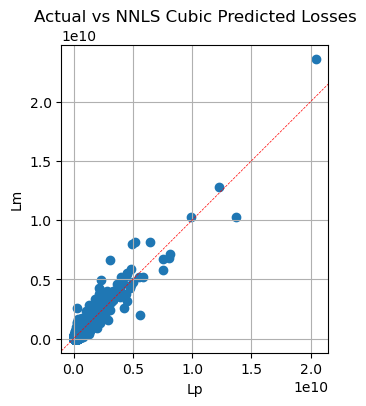

In [31]:
# Set aspect ratio
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')

# Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
plt.scatter(df_nnls_cubic['Lp_nnls_cubic'], df['Loss'])

# Add a diagonal line
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

# Add labels and title
plt.xlabel('Lp')
plt.ylabel('Lm')
plt.title('Actual vs NNLS Cubic Predicted Losses')

# Add grid
plt.grid(True)

# Display the plot
plt.savefig("Actual vs NNLS Cubic Predicted Losses.png")

plt.show()

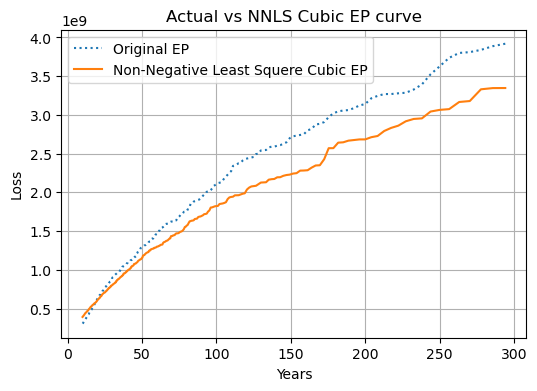

In [32]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
nnls_cubic_ep = pd.DataFrame()
nnls_cubic_ep['rp'] = rank
nnls_cubic_ep['Loss'] = df_nnls_cubic["Lp_nnls_cubic"]
nnls_cubic_ep['Loss'] = nnls_cubic_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
nnls_cubic_ep_filter = nnls_cubic_ep.loc[nnls_cubic_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(nnls_cubic_ep_filter['rp'], nnls_cubic_ep_filter['Loss'], label='Non-Negative Least Squere Cubic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs NNLS Cubic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Actual vs NNLS Cubic EP curve.png")
plt.show()

## Fit Piecewise Quadratic Regression

In [33]:
# Define a piecewise quadratic model function
def pw_quadratic_model_predict(X):
    # Predict values using actual quadratic model
    y_pred = pw_quadratic_model.predict(X)
    # Clamp predicted losses to min/max values
    y_pred[y_pred < min_loss] = 0
    y_pred[y_pred > max_loss] = max_loss
    return y_pred

In [34]:
# Split the complete dataset into training and test sets
X = df[['WIM', 'W*IM^2']]
y = df['Loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Piecewise Quadratic Regression (train and test sets)
pw_quadratic_model = LinearRegression()
pw_quadratic_model.fit(X_train, y_train)
y_pred_pw_quadratic_test = pw_quadratic_model_predict(X_test)
y_pred_pw_quadratic_train = pw_quadratic_model_predict(X_train)

# Calculate MSE and R-squared on the test dataset
mse_pw_quadratic_test = mean_squared_error(y_test, y_pred_pw_quadratic_test)
mse_pw_quadratic_train = mean_squared_error(y_train, y_pred_pw_quadratic_train)

r2_pw_quadratic_test = r2_score(y_test, y_pred_pw_quadratic_test)
r2_pw_quadratic_train = r2_score(y_train, y_pred_pw_quadratic_train)

print("MSE (Train Dataset):", mse_pw_quadratic_train)
print("MSE (Test Dataset):", mse_pw_quadratic_test)
print("\nR-squared (Train Dataset):", r2_pw_quadratic_train)
print("R-squared (Test Dataset):", r2_pw_quadratic_test)

MSE (Train Dataset): 1.0427016671044812e+16
MSE (Test Dataset): 8767602206579480.0

R-squared (Train Dataset): 0.9174563736281065
R-squared (Test Dataset): 0.9038472018461354


In [35]:
# Piecewise Quadratic Regression (train = entire dataset)
pw_quadratic_model.fit(X, y)
y_pred_pw_quadratic = pw_quadratic_model_predict(X)

# Get the model coefficients
a, b = pw_quadratic_model.coef_
print(f'Model coefficients:')
print(f'a: {a}')
print(f'b: {b}')

# Calculate MSE and R-squared on the entire dataset
mse_pw_quadratic = mean_squared_error(y, y_pred_pw_quadratic)
r2_pw_quadratic = r2_score(y, y_pred_pw_quadratic)

print("\nMSE (Entire Dataset):", mse_pw_quadratic)
print("R-squared (Entire Dataset):", r2_pw_quadratic)

# Create a DataFrama for Gap
gap_pw_quadratic = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_pw_quadratic)])


# Predict the Losses using the trained model
df_pw_quadratic = pd.DataFrame({'Lp_pw_quadratic': y_pred_pw_quadratic,
                               'Gap pw quadratic': gap_pw_quadratic})
print(df_pw_quadratic)
print(f'\nModel description:')
print("Mean:", df_pw_quadratic['Lp_pw_quadratic'].mean())
print("Standard deviation:", df_pw_quadratic['Lp_pw_quadratic'].std())
print("Gap(L_PQ):", np.mean(gap_pw_quadratic))

Model coefficients:
a: -4915371827.929331
b: 128614781495.42549

MSE (Entire Dataset): 1.0091214150410542e+16
R-squared (Entire Dataset): 0.9154116615519751
       Lp_pw_quadratic  Gap pw quadratic
0         1.062961e+08         37.744278
1         1.234083e+07        -28.615379
2         5.384473e+07          8.209553
3         2.241040e+06         47.160244
4         1.709659e+07         30.758926
...                ...               ...
24643     5.154416e+06      46223.218019
24644     0.000000e+00       -100.000000
24645     3.809938e+07      15950.843735
24646     7.816679e+07       7317.365926
24647     5.078944e+08         -6.765533

[24648 rows x 2 columns]

Model description:
Mean: 67235286.67058434
Standard deviation: 330433512.129902
Gap(L_PQ): 4786201968.304862


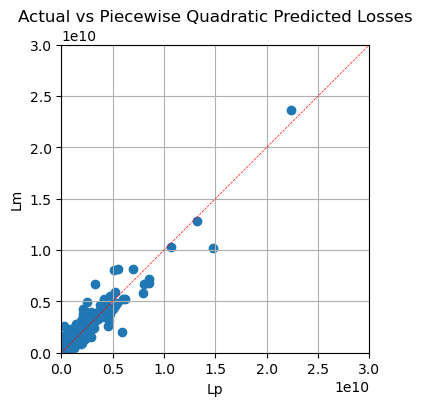

In [36]:
# Set aspect ratio
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')

# Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
plt.scatter(df_pw_quadratic['Lp_pw_quadratic'], df['Loss'])

# Add a diagonal line
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

# Set the y-axis limits
plt.xlim(0, max_loss)
plt.ylim(0, max_loss)

# Add labels and title
plt.xlabel('Lp')
plt.ylabel('Lm')
plt.title('Actual vs Piecewise Quadratic Predicted Losses')

# Add grid
plt.grid(True)

# Display the plot
plt.show()

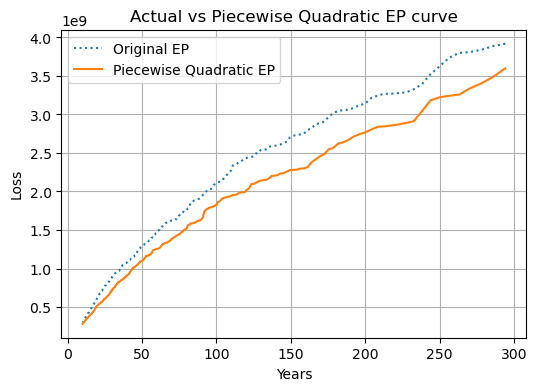

In [37]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
pw_quadratic_ep = pd.DataFrame()
pw_quadratic_ep['rp'] = rank
pw_quadratic_ep['Loss'] = df_pw_quadratic["Lp_pw_quadratic"]
pw_quadratic_ep['Loss'] = pw_quadratic_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
pw_quadratic_ep_filter = pw_quadratic_ep.loc[pw_quadratic_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(pw_quadratic_ep_filter['rp'], pw_quadratic_ep_filter['Loss'], label='Piecewise Quadratic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Piecewise Quadratic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

## Fit Piecewise Cubic Regression

In [38]:
# Define a piecewise cubic model function
def pw_cubic_model_predict(X):
    # Predict values using actual cubic model
    y_pred = pw_cubic_model.predict(X)
    # Clamp predicted losses to min/max values
    y_pred[y_pred < min_loss] = 0
    y_pred[y_pred > max_loss] = max_loss
    return y_pred

In [39]:
# Split the complete dataset into training and test sets
X = df[['WIM', 'W*IM^2', 'W*IM^3']]
y = df['Loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Piecewise Cubic Regression (train and test sets)
pw_cubic_model = LinearRegression()
pw_cubic_model.fit(X_train, y_train)
y_pred_pw_cubic_test = pw_cubic_model_predict(X_test)
y_pred_pw_cubic_train = pw_cubic_model_predict(X_train)

# Calculate MSE and R-squared on the test dataset
mse_pw_cubic_test = mean_squared_error(y_test, y_pred_pw_cubic_test)
mse_pw_cubic_train = mean_squared_error(y_train, y_pred_pw_cubic_train)

r2_pw_cubic_test = r2_score(y_test, y_pred_pw_cubic_test)
r2_pw_cubic_train = r2_score(y_train, y_pred_pw_cubic_train)

print("MSE (Train Dataset):", mse_pw_cubic_train)
print("MSE (Test Dataset):", mse_pw_cubic_test)
print("\nR-squared (Train Dataset):", r2_pw_cubic_train)
print("R-squared (Test Dataset):", r2_pw_cubic_test)

MSE (Train Dataset): 7400545890556887.0
MSE (Test Dataset): 7102728783321957.0

R-squared (Train Dataset): 0.9414148922735952
R-squared (Test Dataset): 0.9221055847479148


In [40]:
# Piecewise Cubic Regression (train = entire dataset)
pw_cubic_model.fit(X, y)
y_pred_pw_cubic = pw_cubic_model_predict(X)

# Get the model coefficients
a, b, c = pw_cubic_model.coef_
print(f'Model coefficients:')
print(f'a: {a}')
print(f'b: {b}')
print(f'c: {c}')

# Calculate MSE and R-squared on the entire dataset
mse_pw_cubic = mean_squared_error(y, y_pred_pw_cubic)
r2_pw_cubic = r2_score(y, y_pred_pw_cubic)

print("\nMSE (Entire Dataset):", mse_pw_cubic)
print("R-squared (Entire Dataset):", r2_pw_cubic)

# Create a DataFrama for Gap
gap_pw_cubic = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_pw_cubic)])

# Predict the Losses using the trained model
df_pw_cubic = pd.DataFrame({'Lp_pw_cubic': y_pred_pw_cubic,
                           'Gap pw cubic': gap_pw_cubic})
print(df_pw_cubic)
print(f'\nModel description:')
print("Mean:", df_pw_cubic['Lp_pw_cubic'].mean())
print("Standard deviation:", df_pw_cubic['Lp_pw_cubic'].std())
print("Avg_Gap(L_PC):", np.mean(gap_pw_cubic))

Model coefficients:
a: -11628459971.697073
b: 204510337933.63696
c: -42909452852.491844

MSE (Entire Dataset): 7338221602758907.0
R-squared (Entire Dataset): 0.9384882767039955
        Lp_pw_cubic  Gap pw cubic
0      1.219863e+08  5.807657e+01
1      1.353600e+07 -2.170200e+01
2      6.728210e+07  3.521407e+01
3      3.951743e+06  1.594953e+02
4      1.713466e+07  3.105016e+01
...             ...           ...
24643  3.900356e+06  3.495287e+04
24644  4.009876e+05  2.243867e+06
24645  5.297259e+06  2.131676e+03
24646  3.223271e+07  2.958611e+03
24647  5.063401e+08 -7.050858e+00

[24648 rows x 2 columns]

Model description:
Mean: 67068278.08406444
Standard deviation: 334607600.09198576
Avg_Gap(L_PC): 8409235901.519457


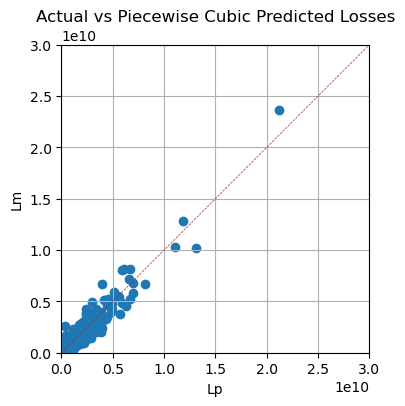

In [41]:
# Set aspect ratio
ax = plt.gca()
ax.set_aspect('equal', adjustable='box')

# Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
plt.scatter(df_pw_cubic['Lp_pw_cubic'], df['Loss'])

# Add a diagonal line
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

# Set the y-axis limits
plt.xlim(0, max_loss)
plt.ylim(0, max_loss)

# Add labels and title
plt.xlabel('Lp')
plt.ylabel('Lm')
plt.title('Actual vs Piecewise Cubic Predicted Losses')

# Add grid
plt.grid(True)

# Display the plot
plt.savefig("Actual vs Piecewise Cubic Predicted Losses.png")
plt.show()

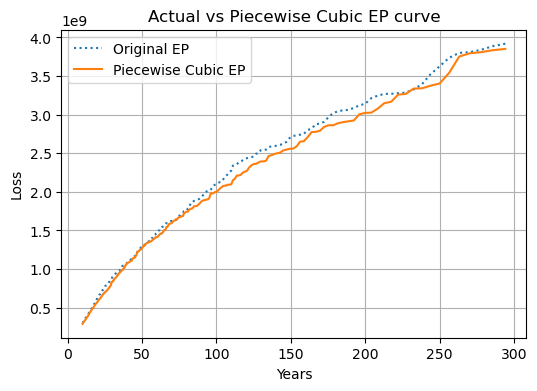

In [42]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
pw_cubic_ep = pd.DataFrame()
pw_cubic_ep['rp'] = rank
pw_cubic_ep['Loss'] = df_pw_cubic["Lp_pw_cubic"]
pw_cubic_ep['Loss'] = pw_cubic_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
pw_cubic_ep_filter = pw_cubic_ep.loc[pw_cubic_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(pw_cubic_ep_filter['rp'], pw_cubic_ep_filter['Loss'], label='Piecewise Cubic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Piecewise Cubic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Actual vs Piecewise Cubic EP curve.png")
plt.show()

## Fit Random Forest Regression Model

In [43]:
# Check if black box models are needed
if run_black_box_models:

    # Split the complete dataset into training and test sets
    X = df[['WIM', 'W*IM^2', 'W*IM^3']]
    y = df['Loss']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Random Forest Regression (train and test sets)
    rf_model = RandomForestRegressor()
    rf_model.fit(X_train, y_train)
    y_pred_rf_test = rf_model.predict(X_test)
    y_pred_rf_train = rf_model.predict(X_train)

    # Calculate MSE and R-squared on the test dataset
    mse_rf_test = mean_squared_error(y_test, y_pred_rf_test)
    mse_rf_train = mean_squared_error(y_train, y_pred_rf_train)

    r2_rf_test = r2_score(y_test, y_pred_rf_test)
    r2_rf_train = r2_score(y_train, y_pred_rf_train)

    print("MSE (Train Dataset):", mse_rf_train)
    print("MSE (Test Dataset):", mse_rf_test)
    print("\nR-squared (Train Dataset):", r2_rf_train)
    print("R-squared (Test Dataset):", r2_rf_test)

MSE (Train Dataset): 2630377649511259.5
MSE (Test Dataset): 6808272968942942.0

R-squared (Train Dataset): 0.9791770823076204
R-squared (Test Dataset): 0.9253348314470831


In [44]:
# Check if black box models are needed
if run_black_box_models:

    # Random Forest Regression (train = entire dataset)
    rf_model.fit(X, y)
    y_pred_rf = rf_model.predict(X)

    # Calculate MSE and R-squared on the entire dataset
    mse_rf = mean_squared_error(y, y_pred_rf)
    r2_rf = r2_score(y, y_pred_rf)

    print("MSE (Entire Dataset):", mse_rf)
    print("R-squared (Entire Dataset):", r2_rf)

    # Create a DataFrama for Gap
    gap_rf = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_rf)])

    # Predict the Losses using the trained model
    df_rf = pd.DataFrame({'Lp_rf': y_pred_rf,
                         'Gap rf': gap_rf})
    print(df_rf)
    print(f'\nModel description:')
    print("Mean:", df_rf['Lp_rf'].mean())
    print("Standard deviation:", df_rf['Lp_rf'].std())
    print("Avg_Gap(L_rf):", np.mean(gap_rf))

MSE (Entire Dataset): 2182285795499187.8
R-squared (Entire Dataset): 0.9817072627031216
              Lp_rf        Gap rf
0      1.011042e+08     31.016332
1      1.595311e+07     -7.720389
2      6.907850e+07     38.824227
3      1.597073e+06      4.873493
4      1.501761e+07     14.858412
...             ...           ...
24643  2.943213e+05   2545.093195
24644  4.232777e+03  23587.054114
24645  1.529604e+06    544.405248
24646  4.865307e+06    361.676390
24647  5.444044e+08     -0.063378

[24648 rows x 2 columns]

Model description:
Mean: 67086819.58451616
Standard deviation: 325993946.93530786
Avg_Gap(L_rf): 2681846255.7142725


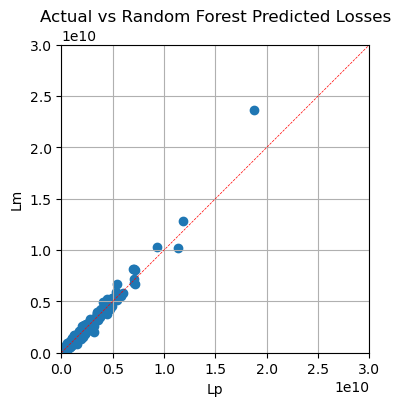

In [45]:
# Check if black box models are needed
if run_black_box_models:

    # Set aspect ratio
    ax = plt.gca()
    ax.set_aspect('equal', adjustable='box')

    # Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
    plt.scatter(df_rf['Lp_rf'], df['Loss'])

    # Add a diagonal line
    plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

    # Set the y-axis limits
    plt.xlim(0, max_loss)
    plt.ylim(0, max_loss)

    # Add labels and title
    plt.xlabel('Lp')
    plt.ylabel('Lm')
    plt.title('Actual vs Random Forest Predicted Losses')

    # Add grid
    plt.grid(True)

    # Display the plot
    plt.savefig("Actual vs Random Forest Predicted Losses.png")
    plt.show()

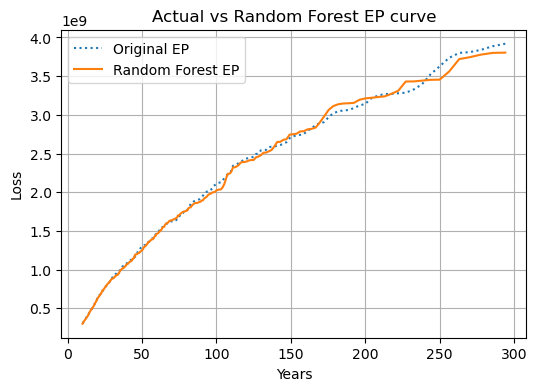

In [46]:
# Compute the maximum return period as inverse of rate
maxRP = 1 / event_loss['Rate'].values[0]
rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

# Compute the sorted event losses along with their return period
original_ep = pd.DataFrame()
original_ep['rp'] = rank
original_ep['Loss'] = event_loss['Loss']
original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

# Compute the sorted predicted losses along with their return period
rf_ep = pd.DataFrame()
rf_ep['rp'] = rank
rf_ep['Loss'] = df_rf["Lp_rf"]
rf_ep['Loss'] = rf_ep['Loss'].sort_values(ascending=False).values

# Filter data within the specified start and finish years
original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
rf_ep_filter = rf_ep.loc[rf_ep.rp.between(start_year, finish_year, inclusive="both")]

# Plot the EP curves
plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
plt.plot(rf_ep_filter['rp'], rf_ep_filter['Loss'], label='Random Forest EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Random Forest EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Actual vs Random Forest EP curve.png")
plt.show()

## Fit XGBoost Regression Model

In [47]:
# Check if black box models are needed
if run_black_box_models:

    # Split the complete dataset into training and test sets
    X = df[['WIM', 'W*IM^2', 'W*IM^3']]
    y = df['Loss']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # XGBoost Regression (train and test sets)
    xgb_model = xgb.XGBRegressor()
    xgb_model.fit(X_train, y_train)
    y_pred_xgb_test = xgb_model.predict(X_test)
    y_pred_xgb_train = xgb_model.predict(X_train)

    # Calculate MSE and R-squared on the test dataset
    mse_xgb_test = mean_squared_error(y_test, y_pred_xgb_test)
    mse_xgb_train = mean_squared_error(y_train, y_pred_xgb_train)

    r2_xgb_test = r2_score(y_test, y_pred_xgb_test)
    r2_xgb_train = r2_score(y_train, y_pred_xgb_train)

    print("MSE (Train Dataset):", mse_xgb_train)
    print("MSE (Test Dataset):", mse_xgb_test)
    print("\nR-squared (Train Dataset):", r2_xgb_train)
    print("R-squared (Test Dataset):", r2_xgb_test)

MSE (Train Dataset): 586640899697114.6
MSE (Test Dataset): 6886400136387638.0

R-squared (Train Dataset): 0.9953559614636909
R-squared (Test Dataset): 0.9244780241256918


In [48]:
# Check if black box models are needed
if run_black_box_models:

    # XGBoost Regression (train = entire dataset)
    xgb_model.fit(X, y)
    y_pred_xgb = xgb_model.predict(X)

    # Calculate MSE and R-squared on the entire dataset
    mse_xgb = mean_squared_error(y, y_pred_xgb)
    r2_xgb = r2_score(y, y_pred_xgb)

    print("MSE (Entire Dataset):", mse_xgb)
    print("R-squared (Entire Dataset):", r2_xgb)

    # Create a DataFrama for Gap
    gap_xgb = ([(y_pred_value - y_value) / y_value * 100 if y_value != 0 else (y_pred_value - y_value) * 100 for y_value, y_pred_value in zip(y, y_pred_xgb)])

    # Predict the Losses using the trained model
    df_xgb = pd.DataFrame({'Lp_xgb': y_pred_xgb,
                         'Gap xgb': gap_xgb})
    print(df_xgb)
    print(f'\nModel description:')
    print("Mean:", df_xgb['Lp_xgb'].mean())
    print("Standard deviation:", df_xgb['Lp_xgb'].std())
    print("Avg_Gap(L_xgb):", np.mean(gap_xgb))

MSE (Entire Dataset): 721438332164471.6
R-squared (Entire Dataset): 0.9939526335581705
             Lp_xgb       Gap xgb
0      1.071730e+08  3.888069e+01
1      1.401411e+07 -1.893644e+01
2      7.547361e+07  5.167622e+01
3      3.628484e+06  1.382681e+02
4      1.699411e+07  2.997517e+01
...             ...           ...
24643  1.670058e+06  1.490897e+04
24644  6.600231e+05  3.693456e+06
24645  7.010464e+06  2.853431e+03
24646  1.290726e+07  1.124790e+03
24647  4.809226e+08 -1.171677e+01

[24648 rows x 2 columns]

Model description:
Mean: 67042780.0
Standard deviation: 342606016.0
Avg_Gap(L_xgb): 4401990850.633294


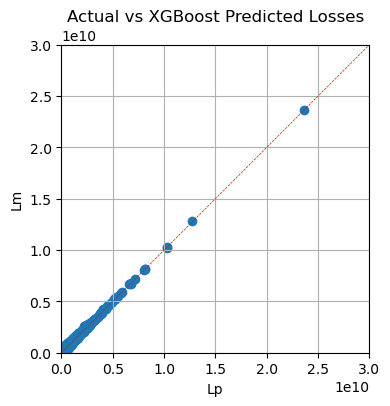

In [49]:
# Check if black box models are needed
if run_black_box_models:

    # Set aspect ratio
    ax = plt.gca()
    ax.set_aspect('equal', adjustable='box')

    # Create a scatter plot with 'pred_Loss' on the x-axis and 'Loss' on the y-axis
    plt.scatter(df_xgb['Lp_xgb'], df['Loss'])

    # Add a diagonal line
    plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=0.5)

    # Set the y-axis limits
    plt.xlim(0, max_loss)
    plt.ylim(0, max_loss)

    # Add labels and title
    plt.xlabel('Lp')
    plt.ylabel('Lm')
    plt.title('Actual vs XGBoost Predicted Losses')

    # Add grid
    plt.grid(True)

    # Display the plot
    plt.savefig("Actual vs XGBoost Predicted Losses.png")

    plt.show()

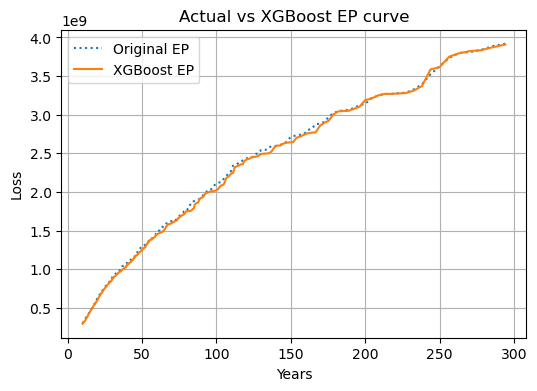

In [50]:
# Check if black box models are needed
if run_black_box_models:

    # Compute the maximum return period as inverse of rate
    maxRP = 1 / event_loss['Rate'].values[0]
    rank = [maxRP / i for i in range(1, len(event_loss['Rate']) + 1)]

    # Compute the sorted event losses along with their return period
    original_ep = pd.DataFrame()
    original_ep['rp'] = rank
    original_ep['Loss'] = event_loss['Loss']
    original_ep['Loss'] = original_ep['Loss'].sort_values(ascending=False).values

    # Compute the sorted predicted losses along with their return period
    xgb_ep = pd.DataFrame()
    xgb_ep['rp'] = rank
    xgb_ep['Loss'] = df_xgb["Lp_xgb"]
    xgb_ep['Loss'] = xgb_ep['Loss'].sort_values(ascending=False).values

    # Filter data within the specified start and finish years
    original_ep_filter = original_ep.loc[original_ep.rp.between(start_year, finish_year, inclusive="both")]
    xgb_ep_filter = xgb_ep.loc[xgb_ep.rp.between(start_year, finish_year, inclusive="both")]

    # Plot the EP curves
    plt.plot(original_ep_filter['rp'], original_ep_filter['Loss'], linestyle=':', label='Original EP')
    plt.plot(xgb_ep_filter['rp'], xgb_ep_filter['Loss'], label='XGBoost EP')

    # Set labels and title
    plt.xlabel('Years')
    plt.ylabel('Loss')
    plt.title('Actual vs XGBoost EP curve')

    # Add a legend and grid
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.savefig("Actual vs XGBoost EP curve.png")
    plt.show()

In [51]:
# Combine event losses with predicted losses of the different regression models
df_loss = pd.DataFrame()
df_loss["RP"] = [maxRP / i for i in range(1, len(event_loss['Loss']) + 1)]

df_loss['Loss'] = df.Loss
df_loss['Loss'] = df_loss['Loss'].sort_values(ascending=False).values

df_loss['Lp_quadratic'] = df_quadratic["Lp_quadratic"]
df_loss['Lp_quadratic'] = df_loss['Lp_quadratic'].sort_values(ascending=False).values

df_loss['Lp_cubic']= df_cubic["Lp_cubic"]
df_loss['Lp_cubic'] = df_loss['Lp_cubic'].sort_values(ascending=False).values


df_loss['Lp_nnls_quadratic'] = df_nnls_quadratic["Lp_nnls_quadratic"]
df_loss['Lp_nnls_quadratic'] = df_loss['Lp_nnls_quadratic'].sort_values(ascending=False).values


df_loss['Lp_nnls_cubic'] = df_nnls_cubic["Lp_nnls_cubic"]
df_loss['Lp_nnls_cubic'] = df_loss['Lp_nnls_cubic'].sort_values(ascending=False).values


df_loss['Lp_pw_quadratic'] = df_pw_quadratic["Lp_pw_quadratic"]
df_loss['Lp_pw_quadratic'] = df_loss['Lp_pw_quadratic'].sort_values(ascending=False).values

df_loss['Lp_pw_cubic']= df_pw_cubic["Lp_pw_cubic"]
df_loss['Lp_pw_cubic'] = df_loss['Lp_pw_cubic'].sort_values(ascending=False).values

if run_black_box_models:
    df_loss['Lp_rf'] = df_rf["Lp_rf"]
    df_loss['Lp_rf'] = df_loss['Lp_rf'].sort_values(ascending=False).values

    df_loss['Lp_xgb']= df_xgb["Lp_xgb"]
    df_loss['Lp_xgb'] = df_loss['Lp_xgb'].sort_values(ascending=False).values

df_loss

,RP,Loss,Lp_quadratic,Lp_cubic,Lp_nnls_quadratic,Lp_nnls_cubic,Lp_pw_quadratic,Lp_pw_cubic,Lp_rf,Lp_xgb
0,10000.000000,2.362179e+10,2.234318e+10,2.115852e+10,2.007564e+10,2.047553e+10,2.234318e+10,2.115852e+10,1.872346e+10,2.358337e+10
1,5000.000000,1.280924e+10,1.475270e+10,1.309148e+10,1.338409e+10,1.371512e+10,1.475270e+10,1.309148e+10,1.179886e+10,1.276650e+10
2,3333.333333,1.028324e+10,1.322431e+10,1.188485e+10,1.200019e+10,1.228239e+10,1.322431e+10,1.188485e+10,1.134316e+10,1.028634e+10
3,2500.000000,1.023946e+10,1.071882e+10,1.106437e+10,9.807541e+09,9.889732e+09,1.071882e+10,1.106437e+10,9.299231e+09,1.026129e+10
4,2000.000000,8.189980e+09,8.553760e+09,8.186975e+09,7.863185e+09,8.142199e+09,8.553760e+09,8.186975e+09,7.193767e+09,8.175790e+09
...,...,...,...,...,...,...,...,...,...,...
24643,0.405778,0.000000e+00,-1.718501e+06,-8.342984e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.035717e+01,-2.030935e+06
24644,0.405762,0.000000e+00,-1.718501e+06,-1.009421e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.570710e+01,-2.326262e+06
24645,0.405745,0.000000e+00,-1.718501e+06,-1.174014e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.067787e+01,-2.326262e+06
24646,0.405729,0.000000e+00,-1.718501e+06,-1.373896e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.863497e+00,-3.167054e+06


## Test Methods in Historical Data

In [52]:
# Function to compute the return period given a loss value for a particular model based on linear interpolation 
# Return Period = (1 - t) * RP at sorted_index + t * RP at (sorted_index - 1)
# t is the proportion of the interval between the two points.

def compute_return_period(value, model):
    # If the predicted loss is negative the return period is zero
    if value < 0:
        return 0
    sorted_index = len(df_loss[model]) - np.searchsorted(df_loss[model].values[::-1], value, side = "right")
    # If the predicted loss is greater than the maximum loss the returned return period is the maximum
    if sorted_index == 0:
        return df_loss['RP'].values[sorted_index]
    # If the predicted loss is less than the minimum loss the returned return period is the minimum
    if sorted_index == len(df_loss[model]):
        return df_loss['RP'].values[sorted_index - 1]
    # Else linearly interpolate the return period between the two losses in between the predicted loss
    if df_loss[model].values[sorted_index - 1] == df_loss[model].values[sorted_index]:
        return_period = df_loss['RP'].values[sorted_index]
    else:
        t = (value - df_loss[model].values[sorted_index]) / (df_loss[model].values[sorted_index - 1] - df_loss[model].values[sorted_index])
        return_period = (1 - t) * df_loss['RP'].values[sorted_index] + t * df_loss['RP'].values[sorted_index - 1]
    return return_period


In [53]:
# Fit a quadratic model on complete dataset
X = df[['WIM', 'W*IM^2']]
y = df['Loss']

# Test the historical data with the quadratic model
X_test = df_test[['WIM', 'W*IM^2']]
y_pred = quadratic_model.predict(X_test)

# Compute the return period of the predicted losses
df_quadratic_test = pd.DataFrame({'Lp_quadratic': y_pred})
df_quadratic_test['RP'] = df_quadratic_test['Lp_quadratic'].apply(compute_return_period, args=('Lp_quadratic',))
df_quadratic_test

,Lp_quadratic,RP
0,1.737216e+09,91.736060
1,-7.308446e+06,0.000000
2,1.728144e+07,0.945184
3,2.090576e+07,1.041760
4,5.041265e+07,1.800041
5,9.922286e+08,43.392039
6,4.165242e+06,0.601464
7,5.541216e+06,0.638709
8,-1.975739e+06,0.000000
9,6.198677e+06,0.655714


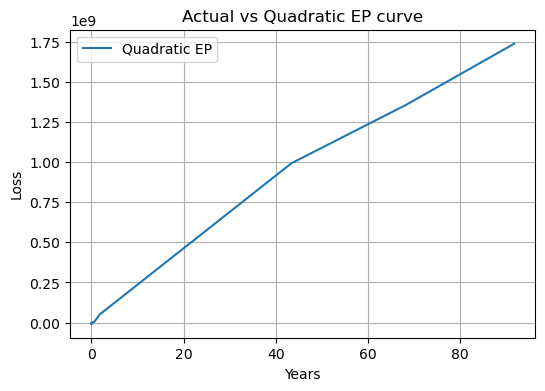

In [54]:
# Sort predicted losses by their return period
quadratic_test_ep = df_quadratic_test.sort_values(by='RP')

# Plot the EP curve
plt.plot(quadratic_test_ep['RP'], quadratic_test_ep['Lp_quadratic'], label='Quadratic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Quadratic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Real vs Quadratic EP curve.png")
plt.show()

In [55]:
# Fit a Cubic model on complete dataset
X = df[['WIM', 'W*IM^2', 'W*IM^3']]
y = df['Loss']

# Test the historical data with the Cubic model
X_test = df_test[['WIM', 'W*IM^2', 'W*IM^3']]
y_pred = cubic_model.predict(X_test)

# Compute the return period of the predicted losses
df_cubic_test = pd.DataFrame({'Lp_cubic': y_pred})
df_cubic_test['RP'] = df_cubic_test['Lp_cubic'].apply(compute_return_period, args=('Lp_cubic',))
df_cubic_test

,Lp_cubic,RP
0,2.227938e+09,116.672329
1,-1.623009e+07,0.000000
2,2.504263e+07,1.328589
3,3.014453e+07,1.481524
4,4.573967e+07,1.969968
5,1.097389e+09,41.799575
6,3.393210e+06,0.580886
7,5.365006e+06,0.658230
8,-3.240769e+06,0.000000
9,-2.185213e+07,0.000000


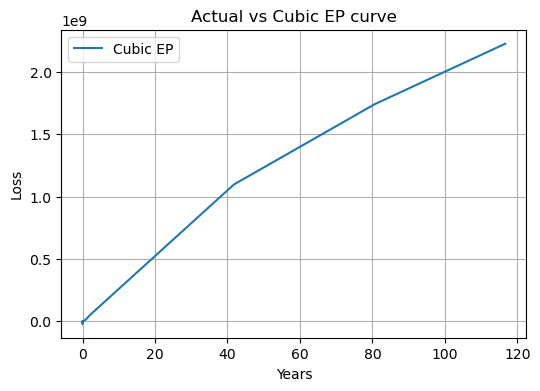

In [56]:
# Sort predicted losses by their return period
cubic_test_ep = df_cubic_test.sort_values(by='RP')

# Plot the EP curve
plt.plot(cubic_test_ep['RP'], cubic_test_ep['Lp_cubic'], label='Cubic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Cubic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Real vs Cubic EP curve.png")
plt.show()

In [57]:
# Fit a NNLS quadratic model on complete dataset
X = df[['WIM', 'W*IM^2']].values
y = df['Loss'].values

# Apply non-negative least squares optimization
nnls_coeffs, rnorm = nnls(X, y)

# Test the historical data with the nnls quadratic model
X_test = df_test[['WIM', 'W*IM^2']]
y_pred_nnls = np.matmul(X_test, nnls_coeffs)


# Compute the return period of the predicted losses
df_nnls_quadratic_test = pd.DataFrame({'Lp_nnls_quadratic': y_pred_nnls})
df_nnls_quadratic_test['RP'] = df_nnls_quadratic_test['Lp_nnls_quadratic'].apply(compute_return_period, args=('Lp_nnls_quadratic',))
df_nnls_quadratic_test

,Lp_nnls_quadratic,RP
0,1.621755e+09,80.969110
1,4.234233e+06,0.501540
2,2.079286e+07,0.757705
3,2.391720e+07,0.807295
4,7.959650e+07,1.729965
5,9.525193e+08,36.935017
6,1.200124e+07,0.620942
7,1.312306e+07,0.637952
8,3.759535e+06,0.494158
9,4.448491e+07,1.144129


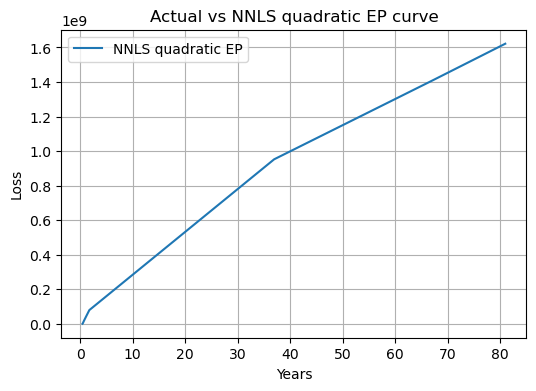

In [58]:
# Sort predicted losses by their return period
nnls_quadratic_test_ep = df_nnls_quadratic_test.sort_values(by='RP')

# Plot the EP curve
plt.plot(nnls_quadratic_test_ep['RP'], nnls_quadratic_test_ep['Lp_nnls_quadratic'], label='NNLS quadratic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs NNLS quadratic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Real vs NNLS quadratic EP curve.png")
plt.show()

In [59]:
# Fit a NNLS Cubic model on complete dataset
X = df[['WIM', 'W*IM^2', 'W*IM^3']].values
y = df['Loss'].values

# Apply non-negative least squares optimization
nnls_coeffs, rnorm = nnls(X, y)

# Test the historical data with the nnls cubic model
X_test = df_test[['WIM', 'W*IM^2', 'W*IM^3']]
y_pred_nnls = np.matmul(X_test, nnls_coeffs)


# Compute the return period of the predicted losses
df_nnls_cubic_test = pd.DataFrame({'Lp_nnls_cubic': y_pred_nnls})
df_nnls_cubic_test['RP'] = df_nnls_cubic_test['Lp_nnls_cubic'].apply(compute_return_period, args=('Lp_nnls_cubic',))
df_nnls_cubic_test

,Lp_nnls_cubic,RP
0,1.589933e+09,80.935674
1,4.050202e+06,0.501332
2,2.005911e+07,0.759254
3,2.310668e+07,0.809403
4,7.668856e+07,1.733289
5,9.477793e+08,37.557126
6,1.152066e+07,0.621122
7,1.261840e+07,0.638504
8,3.601812e+06,0.494131
9,4.263133e+07,1.142923


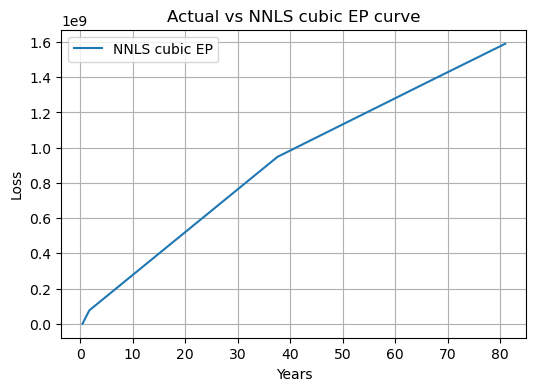

In [60]:
# Sort predicted losses by their return period
nnls_cubic_test_ep = df_nnls_cubic_test.sort_values(by='RP')

# Plot the EP curve
plt.plot(nnls_cubic_test_ep['RP'], nnls_cubic_test_ep['Lp_nnls_cubic'], label='NNLS cubic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs NNLS cubic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Real vs NNLS cubic EP curve.png")
plt.show()

In [62]:
# Fit a piecewise quadratic model on complete dataset
X = df[['WIM', 'W*IM^2']]
y = df['Loss']

# Test the historical data with the quadratic model
X_test = df_test[['WIM', 'W*IM^2']]
y_pred = pw_quadratic_model_predict(X_test)

# Compute the return period of the predicted losses
df_pw_quadratic_test = pd.DataFrame({'Lp_pw_quadratic': y_pred})
df_pw_quadratic_test['RP'] = df_pw_quadratic_test['Lp_pw_quadratic'].apply(compute_return_period, args=('Lp_pw_quadratic',))
df_pw_quadratic_test


,Lp_pw_quadratic,RP
0,1.737216e+09,91.736060
1,0.000000e+00,0.483840
2,1.728144e+07,0.945184
3,2.090576e+07,1.041760
4,5.041265e+07,1.800041
5,9.922286e+08,43.392039
6,4.165242e+06,0.601464
7,5.541216e+06,0.638709
8,0.000000e+00,0.483840
9,6.198677e+06,0.655714


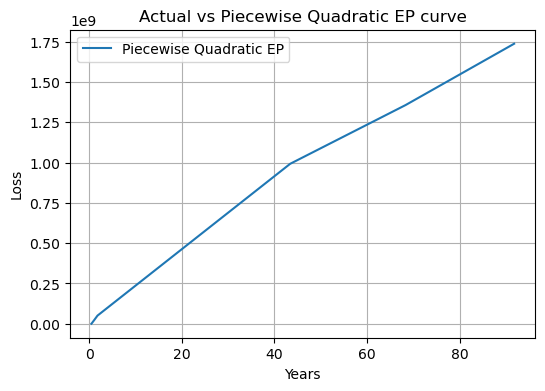

In [63]:
# Sort predicted losses by their return period
pw_quadratic_test_ep = df_pw_quadratic_test.sort_values(by='RP')

# Plot the EP curve
plt.plot(pw_quadratic_test_ep['RP'], pw_quadratic_test_ep['Lp_pw_quadratic'], label='Piecewise Quadratic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Piecewise Quadratic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Real vs Piecewise Quadratic EP curve.png")
plt.show()

In [64]:
# Fit a piecewise cubic model on complete dataset
X = df[['WIM', 'W*IM^2', 'W*IM^3']]
y = df['Loss']

# Test the historical data with the Cubic model
X_test = df_test[['WIM', 'W*IM^2', 'W*IM^3']]
y_pred = pw_cubic_model_predict(X_test)

# Compute the return period of the predicted losses
df_pw_cubic_test = pd.DataFrame({'Lp_pw_cubic': y_pred})
df_pw_cubic_test['RP'] = df_pw_cubic_test['Lp_pw_cubic'].apply(compute_return_period, args=('Lp_pw_cubic',))
df_pw_cubic_test

,Lp_pw_cubic,RP
0,2.227938e+09,116.672329
1,0.000000e+00,0.409383
2,2.504263e+07,1.328589
3,3.014453e+07,1.481524
4,4.573967e+07,1.969968
5,1.097389e+09,41.799575
6,3.393210e+06,0.580886
7,5.365006e+06,0.658230
8,0.000000e+00,0.409383
9,0.000000e+00,0.409383


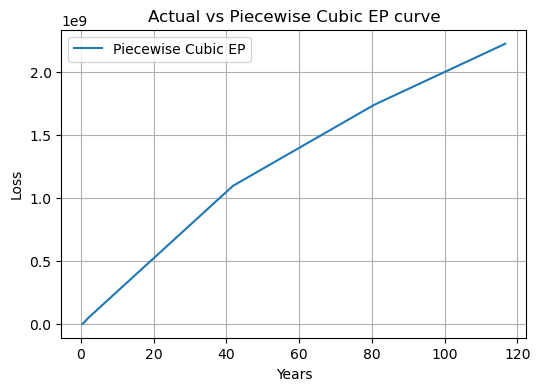

In [65]:
# Sort predicted losses by their return period
pw_cubic_test_ep = df_pw_cubic_test.sort_values(by='RP')

# Plot the EP curve
plt.plot(pw_cubic_test_ep['RP'], pw_cubic_test_ep['Lp_pw_cubic'], label='Piecewise Cubic EP')

# Set labels and title
plt.xlabel('Years')
plt.ylabel('Loss')
plt.title('Actual vs Piecewise Cubic EP curve')

# Add a legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig("Real vs Piecewise Cubic EP curve.png")
plt.show()

In [66]:
# Check if black box models are needed
if run_black_box_models:

    # Fit a Random Forest model on complete dataset
    X = df[['WIM', 'W*IM^2', 'W*IM^3']]
    y = df['Loss']

    # Test the historical data with the Random Forest model
    X_test = df_test[['WIM', 'W*IM^2', 'W*IM^3']]
    y_pred_rf = rf_model.predict(X_test)

    # Compute the return period of the predicted losses
    df_rf_test = pd.DataFrame({'Lp_rf': y_pred_rf})
    df_rf_test['RP'] = df_rf_test['Lp_rf'].apply(compute_return_period, args=('Lp_rf',))

df_rf_test

,Lp_rf,RP
0,2.008113e+09,99.258391
1,3.667563e+04,0.451672
2,2.687597e+07,1.426814
3,1.487652e+07,1.080617
4,4.627211e+07,1.955341
5,1.094728e+09,41.419998
6,6.179176e+06,0.806099
7,8.737007e+06,0.890634
8,1.610647e+05,0.487230
9,1.944413e+07,1.213585


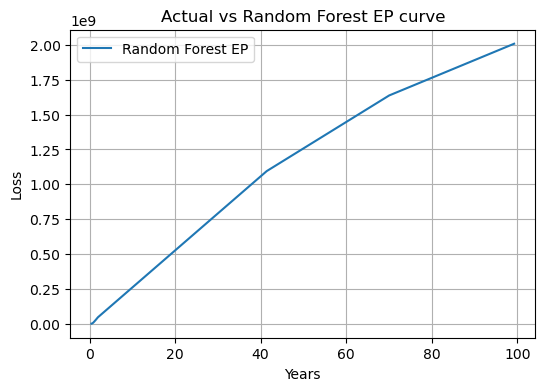

In [67]:
# Check if black box models are needed
if run_black_box_models:

    # Sort predicted losses by their return period
    rf_test_ep = df_rf_test.sort_values(by='RP')

    # Plot the EP curve
    plt.plot(rf_test_ep['RP'], rf_test_ep['Lp_rf'], label='Random Forest EP')

    # Set labels and title
    plt.xlabel('Years')
    plt.ylabel('Loss')
    plt.title('Actual vs Random Forest EP curve')

    # Add a legend and grid
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.savefig("Real vs Random Forest EP curve.png")

    plt.show()

In [68]:
# Check if black box models are needed
if run_black_box_models:

    # Fit a XGBoost model on complete dataset
    X = df[['WIM', 'W*IM^2', 'W*IM^3']]
    y = df['Loss']

    # Test the historical data with the XGBoost model
    X_test = df_test[['WIM', 'W*IM^2', 'W*IM^3']]
    y_pred_xgb = xgb_model.predict(X_test)

    # Compute the return period of the predicted losses
    df_xgb_test = pd.DataFrame({'Lp_xgb': y_pred_xgb})
    df_xgb_test['RP'] = df_xgb_test['Lp_xgb'].apply(compute_return_period, args=('Lp_xgb',))

df_xgb_test

,Lp_xgb,RP
0,1.968963e+09,92.139323
1,-6.881463e+05,0.000000
2,3.017256e+07,1.463486
3,2.629003e+07,1.372307
4,5.479282e+07,2.232856
5,1.024539e+09,38.957994
6,8.967702e+06,0.877655
7,1.086749e+07,0.953925
8,9.313163e+05,0.488806
9,1.701003e+06,0.554285


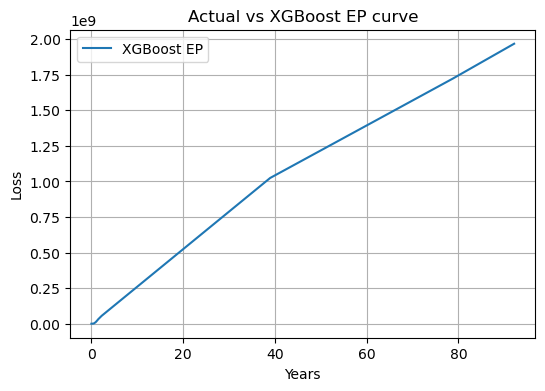

In [69]:
# Check if black box models are needed
if run_black_box_models:

    # Sort predicted losses by their return period
    xgb_test_ep = df_xgb_test.sort_values(by='RP')

    # Plot the EP curve
    plt.plot(xgb_test_ep['RP'], xgb_test_ep['Lp_xgb'], label='XGBoost EP')

    # Set labels and title
    plt.xlabel('Years')
    plt.ylabel('Loss')
    plt.title('Actual vs XGBoost EP curve')

    # Add a legend and grid
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.savefig("Real vs XGBoost EP curve.png")
    plt.show()

In [70]:
# Check if black box models are needed
if run_black_box_models:
    df_loss_test = pd.concat([df_quadratic_test, df_cubic_test, df_nnls_quadratic_test, df_nnls_cubic_test, df_pw_quadratic_test, df_pw_cubic_test, df_rf_test, df_xgb_test], axis=1)
    df_loss_test = df_loss_test.rename(columns={'Lp_quadratic': 'Quadratic', 'Lp_cubic': 'Cubic','Lp_nnls_quadratic':'NNLS Quadratic' , 'Lp_nnls_cubic':'NNLS Cubic', 'Lp_pw_quadratic': 'Piecewise Quadratic', 'Lp_pw_cubic': 'Piecewise Cubic', 'Lp_rf': 'Random Forest', 'Lp_xgb': 'XGBoost'})
else:
    df_loss_test = pd.concat([df_quadratic_test, df_cubic_test, df_pw_quadratic_test, df_pw_cubic_test], axis=1)
    df_loss_test = df_loss_test.rename(columns={'Lp_quadratic': 'Quadratic', 'Lp_cubic': 'Cubic', 'Lp_nnls_quadratic':'NNLS Quadratic' , 'Lp_nnls_cubic':'NNLS Cubic', 'Lp_pw_quadratic': 'Piecewise Quadratic', 'Lp_pw_cubic': 'Piecewise Cubic'})

df_loss_test = df_loss_test.drop('RP', axis=1)
df_loss_test

,Quadratic,Cubic,NNLS Quadratic,NNLS Cubic,Piecewise Quadratic,Piecewise Cubic,Random Forest,XGBoost
0,1.737216e+09,2.227938e+09,1.621755e+09,1.589933e+09,1.737216e+09,2.227938e+09,2.008113e+09,1.968963e+09
1,-7.308446e+06,-1.623009e+07,4.234233e+06,4.050202e+06,0.000000e+00,0.000000e+00,3.667563e+04,-6.881463e+05
2,1.728144e+07,2.504263e+07,2.079286e+07,2.005911e+07,1.728144e+07,2.504263e+07,2.687597e+07,3.017256e+07
3,2.090576e+07,3.014453e+07,2.391720e+07,2.310668e+07,2.090576e+07,3.014453e+07,1.487652e+07,2.629003e+07
4,5.041265e+07,4.573967e+07,7.959650e+07,7.668856e+07,5.041265e+07,4.573967e+07,4.627211e+07,5.479282e+07
5,9.922286e+08,1.097389e+09,9.525193e+08,9.477793e+08,9.922286e+08,1.097389e+09,1.094728e+09,1.024539e+09
6,4.165242e+06,3.393210e+06,1.200124e+07,1.152066e+07,4.165242e+06,3.393210e+06,6.179176e+06,8.967702e+06
7,5.541216e+06,5.365006e+06,1.312306e+07,1.261840e+07,5.541216e+06,5.365006e+06,8.737007e+06,1.086749e+07
8,-1.975739e+06,-3.240769e+06,3.759535e+06,3.601812e+06,0.000000e+00,0.000000e+00,1.610647e+05,9.313163e+05
9,6.198677e+06,-2.185213e+07,4.448491e+07,4.263133e+07,6.198677e+06,0.000000e+00,1.944413e+07,1.701003e+06


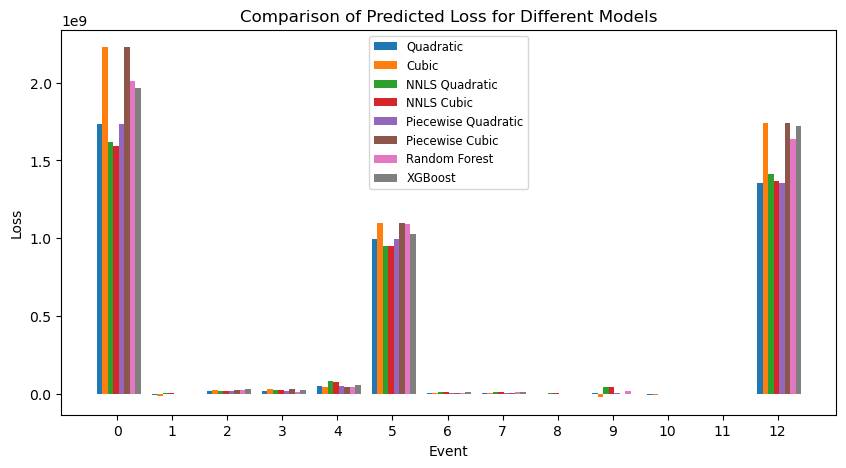

In [71]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 5))

if run_black_box_models:
    models = df_loss_test[['Quadratic', 'Cubic', 'NNLS Quadratic', 'NNLS Cubic', 'Piecewise Quadratic', 'Piecewise Cubic', 'Random Forest', 'XGBoost']]
else:
    models = df_loss_test[['Quadratic', 'Cubic', 'NNLS Quadratic' , 'NNLS Cubic', 'Piecewise Quadratic', 'Piecewise Cubic']]

bar_width = 0.1
bar_positions = range(len(models))
pad = bar_width * (len(models) / 2)

for i, model in enumerate(models):
    plt.bar([pos + i * bar_width - 0.5 * pad for pos in bar_positions], df_loss_test[model], width=bar_width, label=model)

# Adding labels and title
plt.xlabel('Event')
plt.ylabel('Loss')
plt.title('Comparison of Predicted Loss for Different Models')

# Adding x-axis labels
plt.xticks(bar_positions)

# Adding legend
plt.legend(fontsize='small')

# Show the plot
plt.savefig("Comparison of Predicted Loss for Different Models.png")
plt.show()

In [72]:
# Create a DataFrame for the desired variables
df_export = pd.DataFrame({
    'Event_ID': event_loss.EventID,
    'Loss': df['Loss'],
    'WIM': df['WIM'],
    'W*IM^2': df['W*IM^2'],
    'W*IM^3': df['W*IM^3'],
    'Lp_quadratic': df_quadratic['Lp_quadratic'],
    'Gap quadratic': df_quadratic['Gap quadratic'],
    'Lp_pw_quadratic': df_pw_quadratic['Lp_pw_quadratic'],
    'Gap pw quadratic': df_pw_quadratic['Gap pw quadratic'],
    'Lp_nnls_quadratic': df_nnls_quadratic['Lp_nnls_quadratic'],
    'Gap nnls quadratic': df_nnls_quadratic['Gap nnls quadratic'],
    'Lp_cubic': df_cubic['Lp_cubic'],
    'Gap cubic': df_cubic['Gap cubic'],
    'Lp_pw_cubic': df_pw_cubic['Lp_pw_cubic'],
    'Gap pw cubic': df_pw_cubic['Gap pw cubic'],
    'Lp_nnls_cubic': df_nnls_cubic['Lp_nnls_cubic'],
    'Gap nnls cubic': df_nnls_cubic['Gap nnls cubic'],
    'Lp_rf': df_rf['Lp_rf'],
    'Gap rf': df_rf['Gap rf'],
    'Lp_xgb': df_xgb['Lp_xgb'],
    'Gap xgb': df_xgb['Gap xgb']
})

# Save the DataFrame to an Excel file
excel_filename = 'RESULTS_0.05D.xlsx'
df_export.to_excel(excel_filename, index=False)
print(f"Excel file '{excel_filename}' created successfully.")

Excel file 'RESULTS_0.05D.xlsx' created successfully.
